In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/intel-image-classification/seg_train/seg_train/mountain/14986.jpg
/kaggle/input/intel-image-classification/seg_train/seg_train/mountain/3138.jpg
/kaggle/input/intel-image-classification/seg_train/seg_train/mountain/1700.jpg
/kaggle/input/intel-image-classification/seg_train/seg_train/mountain/16257.jpg
/kaggle/input/intel-image-classification/seg_train/seg_train/mountain/2863.jpg
/kaggle/input/intel-image-classification/seg_train/seg_train/mountain/771.jpg
/kaggle/input/intel-image-classification/seg_train/seg_train/mountain/12167.jpg
/kaggle/input/intel-image-classification/seg_train/seg_train/mountain/17643.jpg
/kaggle/input/intel-image-classification/seg_train/seg_train/mountain/6560.jpg
/kaggle/input/intel-image-classification/seg_train/seg_train/mountain/10162.jpg
/kaggle/input/intel-image-classification/seg_train/seg_train/mountain/4009.jpg
/kaggle/input/intel-image-classification/seg_train/seg_train/mountain/15823.jpg
/kaggle/input/intel-image-classification/seg_tr

## 📊 Adım 1: Veri Setini ve Kütüphaneleri Yükleme

In [2]:
# Temel kütüphaneleri yükleyelim.
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# TensorFlow ve Keras
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

# Sklearn 
from sklearn.metrics import classification_report, confusion_matrix
import itertools


2025-09-22 01:54:33.929612: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1758506074.126775      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1758506074.183909      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Sınıflar: ['mountain', 'street', 'buildings', 'sea', 'forest', 'glacier']


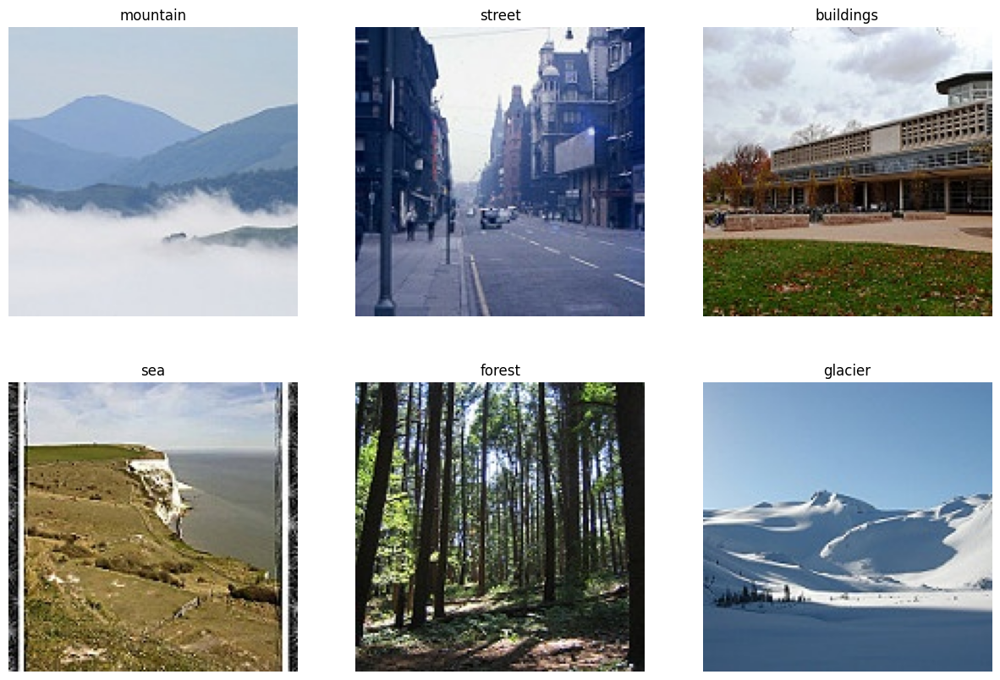

In [3]:
# Veri seti yolu (Kaggle dataset path)
dataset_path = "/kaggle/input/intel-image-classification/seg_train/seg_train"

# Sınıf isimlerini al
classes = os.listdir(dataset_path)
print("Sınıflar:", classes)

# Her sınıftan birkaç örnek görseli görselleştirelim
plt.figure(figsize=(15,10))
for i, cls in enumerate(classes):
    sample_img = os.listdir(os.path.join(dataset_path, cls))[0]
    img_path = os.path.join(dataset_path, cls, sample_img)
    img = plt.imread(img_path)
    plt.subplot(2,3,i+1)
    plt.imshow(img)
    plt.title(cls)
    plt.axis('off')
plt.show()

## 📊 Adım 2: Veri Setini DataFrame'e Dönüştürme ve İnceleme

Görseller doğrudan klasörler içinde sınıflandırılmış durumda. Bu adımda:
- Her bir görselin yolunu ve ait olduğu sınıfı bir tabloya ekleyeceğiz.  
- `head()` ile ilk 5 satırı görüntüleyeceğiz.  
- `describe()` ile istatistiksel özetini inceleyeceğiz.  

Böylece veri setini tablo formatında görüp daha kolay analiz yapabileceğiz.

In [4]:
import pandas as pd

# Görselleri dataframe'e dönüştürelim
image_paths = []
labels = []

for cls in classes:
    cls_path = os.path.join(dataset_path, cls)
    for img_name in os.listdir(cls_path):
        image_paths.append(os.path.join(cls_path, img_name))
        labels.append(cls)

# DataFrame oluştur
df = pd.DataFrame({
    "image_path": image_paths,
    "label": labels
})

# İlk 5 satırı göster
print("🔹 DataFrame ilk 5 satır:")
display(df.head())

# Veri seti özet istatistikleri
print("\n🔹 DataFrame özet bilgisi:")
display(df.describe(include="all"))

# Sınıf dağılımı
print("\n🔹 Sınıf dağılımı:")
display(df['label'].value_counts())

🔹 DataFrame ilk 5 satır:


,image_path,label
0,/kaggle/input/intel-image-classification/seg_t...,mountain
1,/kaggle/input/intel-image-classification/seg_t...,mountain
2,/kaggle/input/intel-image-classification/seg_t...,mountain
3,/kaggle/input/intel-image-classification/seg_t...,mountain
4,/kaggle/input/intel-image-classification/seg_t...,mountain



🔹 DataFrame özet bilgisi:


,image_path,label
count,14034,14034
unique,14034,6
top,/kaggle/input/intel-image-classification/seg_t...,mountain
freq,1,2512



🔹 Sınıf dağılımı:


label
mountain     2512
glacier      2404
street       2382
sea          2274
forest       2271
buildings    2191
Name: count, dtype: int64

## 📊 Adım 3: Sınıf Dağılımını Görselleştirme

Her sınıfın kaç tane görsel içerdiğini görselleştirmek, veri dengesini anlamamıza yardımcı olur.  
Eğer bazı sınıflarda çok az veri varsa, **data augmentation** gibi yöntemlere ihtiyaç duyabiliriz.  

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


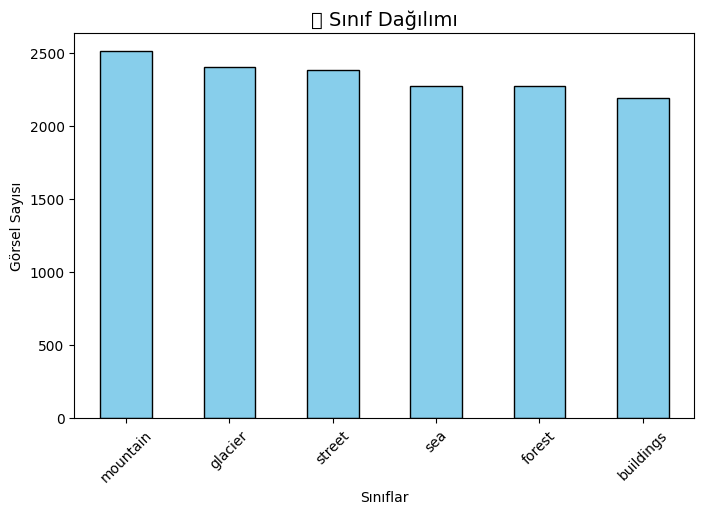

In [5]:
import matplotlib.pyplot as plt

# Sınıf dağılımı
class_counts = df['label'].value_counts()

# Çubuk grafik
plt.figure(figsize=(8,5))
class_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title("📊 Sınıf Dağılımı", fontsize=14)
plt.xlabel("Sınıflar")
plt.ylabel("Görsel Sayısı")
plt.xticks(rotation=45)
plt.show()


## 🛠️ Adım 4: Veri Ön İşleme

Derin öğrenme modelleri için görselleri doğrudan kullanamayız. Bu nedenle:  
1. Görselleri aynı boyuta getireceğiz (150x150).  
2. Pikselleri 0-1 aralığına ölçekleyeceğiz.  
3. Eğitim setinde overfitting’i azaltmak için **data augmentation** uygulayacağız.  
4. Eğitim (train) ve doğrulama (validation) setlerini hazırlayacağız.  

In [6]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Eğitim veri artırma (augmentation) için generator
train_datagen = ImageDataGenerator(
    rescale=1./255,          # Normalizasyon
    rotation_range=20,       # Döndürme
    width_shift_range=0.1,   # Yatay kaydırma
    height_shift_range=0.1,  # Dikey kaydırma
    zoom_range=0.2,          # Zoom
    horizontal_flip=True,    # Yatay çevirme
    validation_split=0.2     # %20 doğrulama verisi
)

# Eğitim seti
train_generator = train_datagen.flow_from_directory(
    "/kaggle/input/intel-image-classification/seg_train/seg_train",
    target_size=(150, 150),
    batch_size=32,
    class_mode="categorical",
    subset="training"
)

# Doğrulama seti
val_generator = train_datagen.flow_from_directory(
    "/kaggle/input/intel-image-classification/seg_train/seg_train",
    target_size=(150, 150),
    batch_size=32,
    class_mode="categorical",
    subset="validation"
)

Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.


## 🔍 Adım 5: Eksik Veri Kontrolü

Modeli eğitmeden önce, veri setinde eksik değer (missing values) olup olmadığını kontrol etmeliyiz.  
- `isnull().sum()` ile DataFrame'deki boş hücreleri göreceğiz.  
- Ayrıca dosya yollarının gerçekten var olup olmadığını kontrol edeceğiz.  


In [7]:
# Eksik değer var mı?
print("🔹 Eksik veri sayısı (NaN):")
print(df.isnull().sum())

# Dosya yolları gerçekten var mı kontrol edelim
import os

missing_files = [path for path in df["image_path"] if not os.path.exists(path)]
print(f"\n🔹 Eksik dosya sayısı: {len(missing_files)}")

# Eğer varsa, ilk birkaçını gösterelim
if len(missing_files) > 0:
    print("Eksik dosya örnekleri:", missing_files[:5])


🔹 Eksik veri sayısı (NaN):
image_path    0
label         0
dtype: int64

🔹 Eksik dosya sayısı: 0


## 🎨 Adım 6: Augmentation Sonrası Görselleştirme

Veri artırma (augmentation) işlemlerinin doğru şekilde uygulandığını görmek için,  
`train_generator` içerisinden bir batch alıp birkaç örnek görseli ekrana çizdireceğiz.  


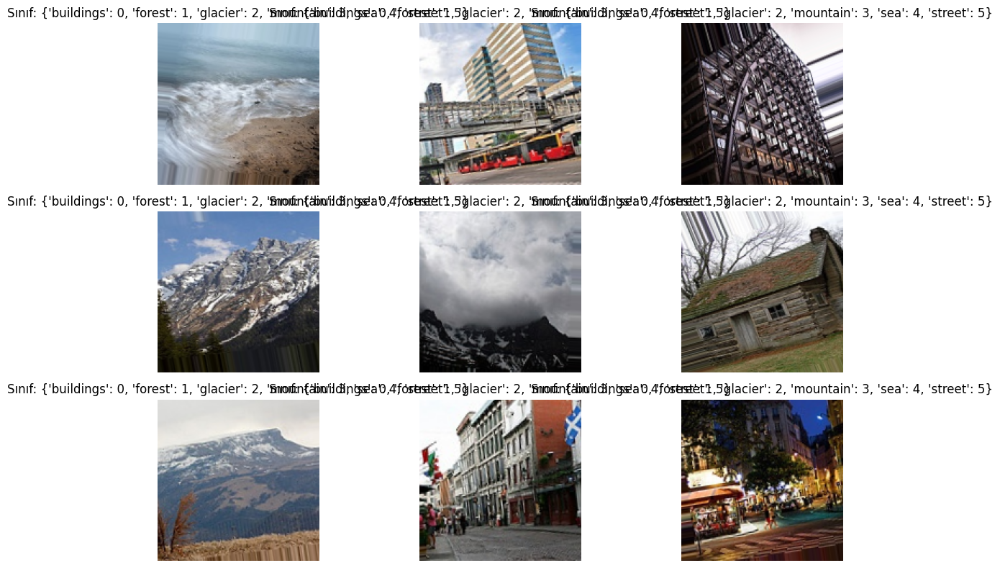

In [8]:
import matplotlib.pyplot as plt

# Bir batch al
images, labels = next(train_generator)

plt.figure(figsize=(12, 8))
for i in range(9):  # ilk 9 resmi gösterelim
    plt.subplot(3, 3, i+1)
    plt.imshow(images[i])
    plt.title(f"Sınıf: {train_generator.class_indices}")
    plt.axis("off")
plt.tight_layout()
plt.show()

Daha okunaklı yapmaya çalışıyorum sınıf isimlerini:

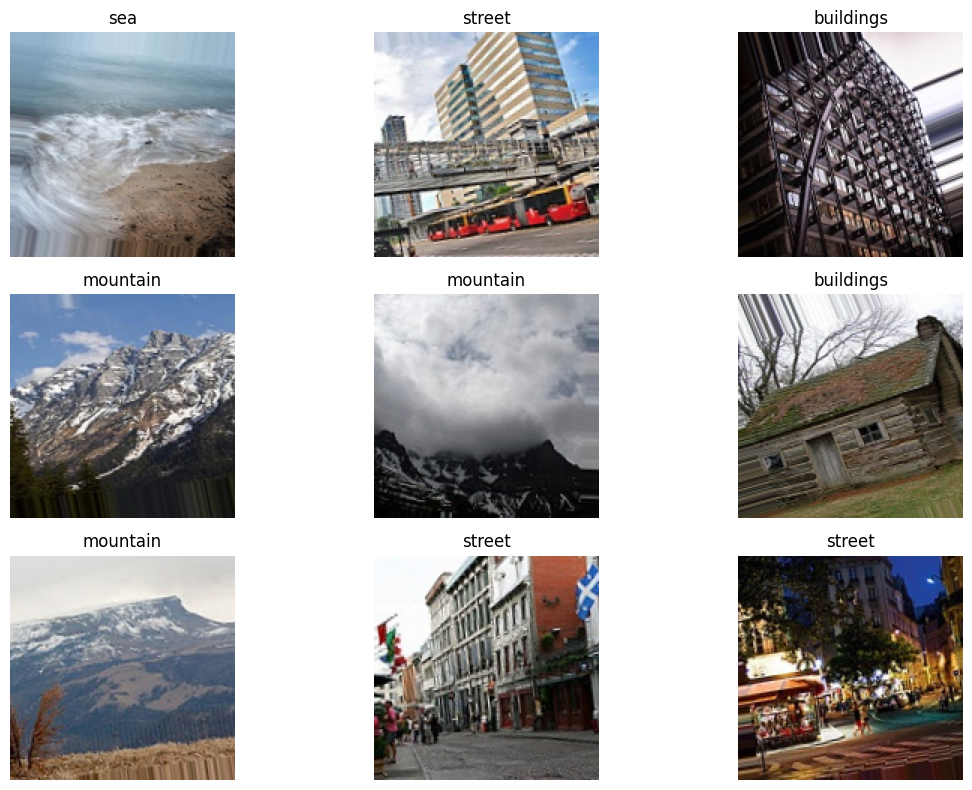

In [9]:
# Class indices tersine çevirip label isimlerini alacağız
class_labels = {v: k for k, v in train_generator.class_indices.items()}

plt.figure(figsize=(12, 8))
for i in range(9):  # ilk 9 resmi gösterelim
    plt.subplot(3, 3, i+1)
    plt.imshow(images[i])
    label_index = np.argmax(labels[i])
    plt.title(class_labels[label_index])  # okunabilir sınıf adı
    plt.axis("off")
plt.tight_layout()
plt.show()

## 🛠️Adım 7: Modeli Oluşturma ve Eğitme

Bu aşamada:
- Basit bir CNN modeli kuracağız.
- Modelin yapısı:
    - Convolutional katmanlar (özellik çıkarımı)
    - MaxPooling katmanları (boyut küçültme)
    - Dropout (overfitting önleme)
    - Dense katmanlar (sınıflandırma)
- Aktivasyon fonksiyonları:
    - ReLU (ara katmanlar)
    - Softmax (çıkış katmanı)
- Model compile edilerek eğitim için hazırlanacak.

In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# class_labels'i train_generator'dan al
class_labels = list(train_generator.class_indices.keys())

# Modeli tanımla
model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D(2,2),

    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),

    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D(2,2),

    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(class_labels), activation='softmax')
])

# Modeli compile et
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1758506092.858494      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     4,735,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,829,126 (18.42 MB)

 Trainable params: 4,829,126 (18.42 MB)

 Non-trainable params: 0 (0.00 B)

In [11]:
# Modeli eğit
history = model.fit(
    train_generator,               # eğitim verisi
    epochs=15,                     # epoch sayısı
    validation_data=val_generator  # doğrulama verisi
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15


I0000 00:00:1758506097.347219      78 service.cc:148] XLA service 0x78f4140044a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1758506097.348246      78 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1758506097.655981      78 cuda_dnn.cc:529] Loaded cuDNN version 90300


  1/351 ━━━━━━━━━━━━━━━━━━━━ 34:51 6s/step - accuracy: 0.2812 - loss: 1.8024

I0000 00:00:1758506100.761370      78 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


351/351 ━━━━━━━━━━━━━━━━━━━━ 124s 336ms/step - accuracy: 0.4676 - loss: 1.3339 - val_accuracy: 0.6491 - val_loss: 0.9249
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 75s 213ms/step - accuracy: 0.6379 - loss: 0.9521 - val_accuracy: 0.7165 - val_loss: 0.7968
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 212ms/step - accuracy: 0.6888 - loss: 0.8485 - val_accuracy: 0.6940 - val_loss: 0.7713
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 211ms/step - accuracy: 0.7035 - loss: 0.8033 - val_accuracy: 0.7564 - val_loss: 0.6772
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 75s 213ms/step - accuracy: 0.7412 - loss: 0.7333 - val_accuracy: 0.7800 - val_loss: 0.6210
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 211ms/step - accuracy: 0.7530 - loss: 0.6806 - val_accuracy: 0.6994 - val_loss: 0.7964
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 212ms/step - accuracy: 0.7609 - loss: 0.6714 - val_accuracy: 0.7718 - val_loss: 0.6219
Epoch 8/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 211ms/step - accuracy: 0.7728 - loss: 0.6476 - va

## 🔍Adım 8: Model Değerlendirme

Modelimizi eğittikten sonra performansını görselleştireceğiz ve yorumlayacağız:

- **Accuracy & Loss Grafikleri** → Overfitting / Underfitting kontrolü
- **Confusion Matrix & Classification Report** → Sınıf bazında performans
- **Grad-CAM Görselleştirmesi** → Modelin hangi bölgelerden etkilendiğini görselleştirme

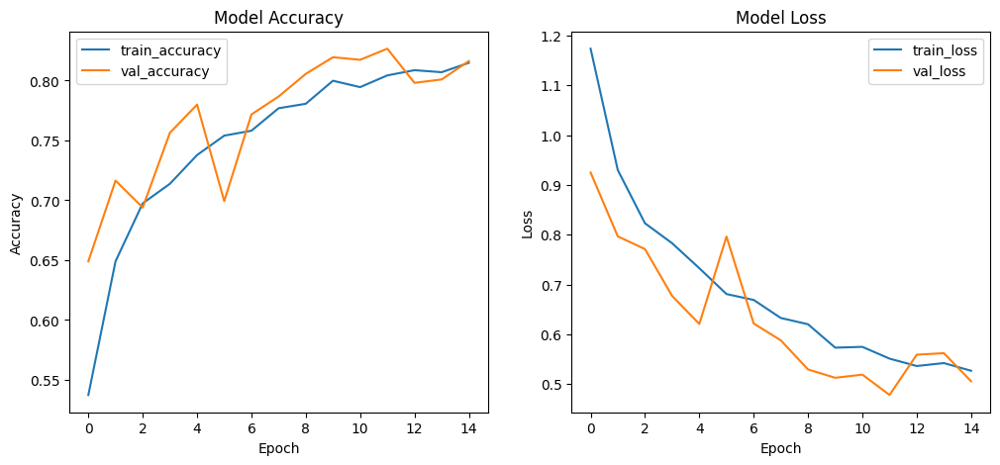

In [12]:
# Accuracy ve Loss grafikleri
plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='train_accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.title("Model Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# Loss
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title("Model Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.show()

Şu anki CNN modeli basit kaldı. Daha güçlü bir yöntem gerekiyor:

Transfer Learning: EfficientNetB1/B2, ResNet50, InceptionV3 gibi önceden eğitilmiş modeller kullanmalıyız.

Veri Augmentation: Renk değişiklikleri, rotation, zoom, cutout, MixUp, CutMix gibi yöntemlerle veriyi çeşitlendirebiliriz.

Epoch sayısını artırıp (30–50) EarlyStopping ile durdurabiliriz.

Learning Rate Scheduler ile daha iyi optimize edebiliriz.

## 📊 Adım 10: Accuracy, Loss grafikleri  (epoch bazında) 

Loss ve accuracy’yi görselleştirip overfitting durumunu inceleyebilirim:

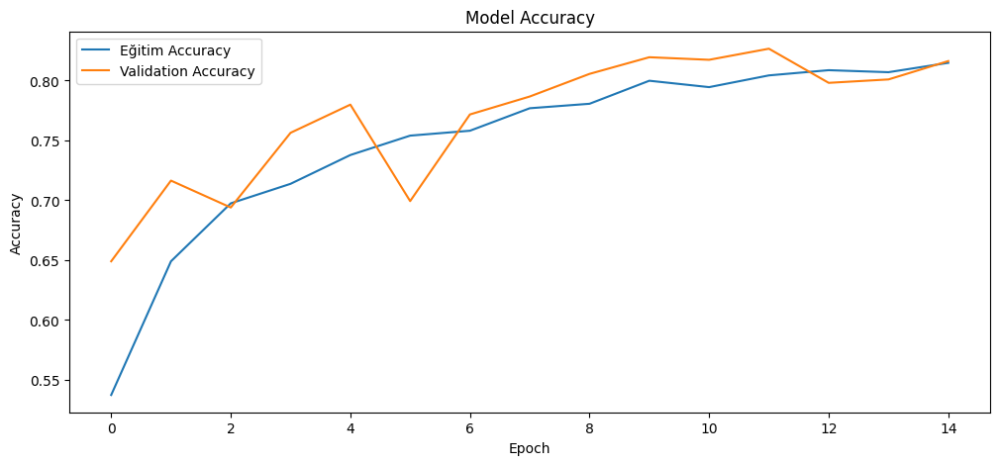

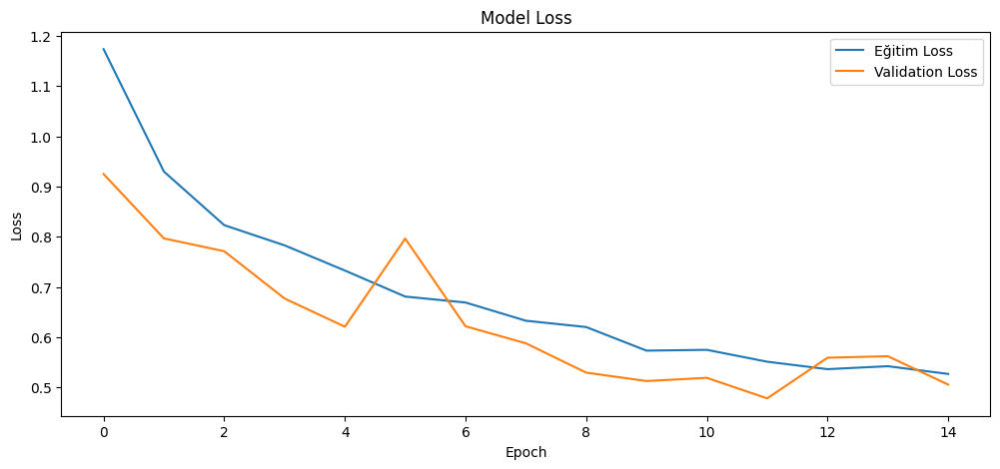

In [13]:
import matplotlib.pyplot as plt

# Accuracy grafiği
plt.figure(figsize=(12,5))
plt.plot(history.history['accuracy'], label='Eğitim Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Loss grafiği
plt.figure(figsize=(12,5))
plt.plot(history.history['loss'], label='Eğitim Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [14]:
model.save('efficientnetb1_intel_best_model.h5')

## 📊 Adım 11: Test Seti Üzerinde Değerlendirme

In [15]:
# -------------------------
# Test verisini hazırla
# -------------------------
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    "/kaggle/input/intel-image-classification/seg_test/seg_test",  # test klasörü
    target_size=(150,150),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# -------------------------
# Modeli test et
# -------------------------
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Test Loss: {test_loss:.4f}")


Found 3000 images belonging to 6 classes.
94/94 ━━━━━━━━━━━━━━━━━━━━ 13s 144ms/step - accuracy: 0.8692 - loss: 0.3807
Test Accuracy: 0.8497
Test Loss: 0.4147


Bu kod, test verilerini doğru şekilde kullanır ve hangi sınıflarda modelin güçlü veya zayıf olduğunu gösterir: 

94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step


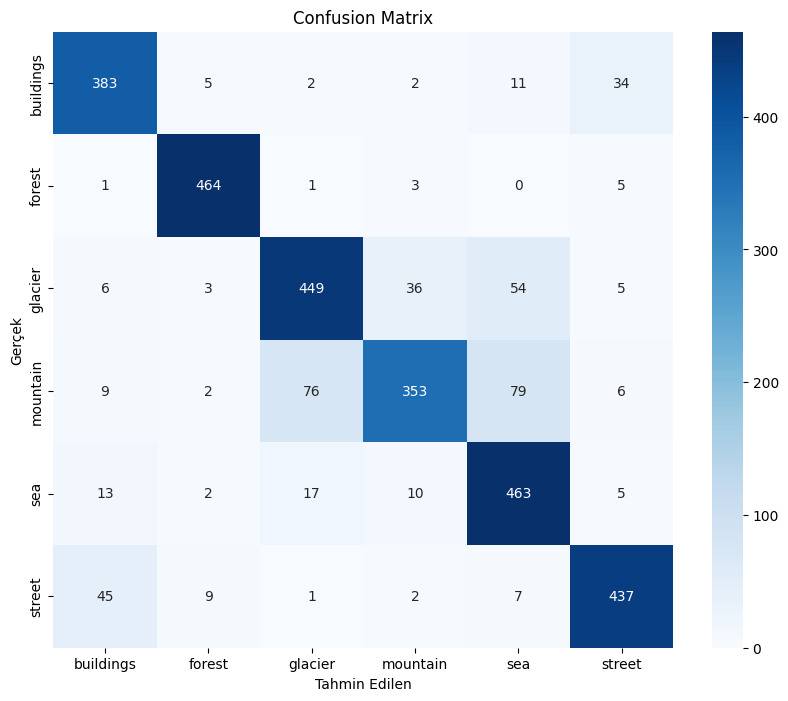

📊 Classification Report:
               precision    recall  f1-score   support

   buildings       0.84      0.88      0.86       437
      forest       0.96      0.98      0.97       474
     glacier       0.82      0.81      0.82       553
    mountain       0.87      0.67      0.76       525
         sea       0.75      0.91      0.82       510
      street       0.89      0.87      0.88       501

    accuracy                           0.85      3000
   macro avg       0.85      0.85      0.85      3000
weighted avg       0.85      0.85      0.85      3000



In [16]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

# -------------------------
# Tahminleri al
# -------------------------
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)  # en yüksek olasılığı sınıf olarak seç
y_true = test_generator.classes  # gerçek etiketler
class_labels = list(test_generator.class_indices.keys())  # sınıf isimleri

# -------------------------
# Confusion Matrix
# -------------------------
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(10,8))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    xticklabels=class_labels,
    yticklabels=class_labels,
    cmap="Blues"
)
plt.xlabel("Tahmin Edilen")
plt.ylabel("Gerçek")
plt.title("Confusion Matrix")
plt.show()

# -------------------------
# Classification Report
# -------------------------
report = classification_report(y_true, y_pred_classes, target_names=class_labels)
print("📊 Classification Report:\n", report)


Accuracy: 0.85 → Test setinde model %85 doğrulukla tahmin yapabiliyor. Bu, oldukça iyi bir başlangıç seviyesi.

Macro Avg & Weighted Avg: Precision, recall ve F1-score da 0.85 civarında, yani model sınıflar arasında genel olarak dengeli performans gösteriyor.

3️⃣ Güçlü Yönler

Forest ve street sınıflarında yüksek precision ve recall → bu sınıflar model için oldukça net ve ayırt edilebilir.

Sea ve buildings sınıflarında recall yüksek → model çoğu örneği yakalıyor.

4️⃣ Zayıf Yönler

Glacier ve mountain sınıflarında recall düşük → model bu sınıfları diğer sınıflarla karıştırıyor.

Bu, görsellerin birbirine benzeyen özelliklerinden (renk, doku, yapı) kaynaklanıyor olabilir.

5️⃣ İyileştirme Önerileri

Data Augmentation: Glacier ve mountain sınıfları için daha fazla veri veya veri artırma (rotasyon, zoom, kontrast, renk jitter) eklemek.

Class Weights: Glacier ve mountain sınıflarına ağırlık vererek eğitim sırasında daha dikkatli öğrenmesini sağlamak.

Dropout / Regularization: Overfitting varsa artırmak.

Fine-Tuning: Pretrained modelin üst katmanlarını daha fazla eğitmek, özellikle zor sınıflar için.

## 📊 Adım 12: Optimize Edilmiş Transfer Learning Model Eğitimi ve Değerlendirme

Hedefimiz: Glacier ve Mountain sınıflarındaki F1-score’u artırmak ve genel olarak modelin daha dengeli olmasını sağlamak.

Bunu yapmak için adım adım plan şöyle olacak:

1️⃣ Veri Augmentation

Zor sınıflar için veri artırma uygulanacak (rotation, zoom, flip, brightness, contrast).

Böylece model farklı varyasyonları görerek genelleme yapacak.

2️⃣ Class Weights

Glacier ve Mountain sınıflarına daha fazla ağırlık verilecek.

Eğitim sırasında model, zor sınıflara daha dikkat edecek.

3️⃣ Dropout / Regularization

Dropout oranları artırılacak veya ek batch normalization ile overfitting azaltılacak.

4️⃣ Fine-Tuning

Pretrained modelin üst katmanları daha fazla eğitilecek.

Özellikle zor sınıfların temsil edildiği katmanlar üzerinde optimizasyon yapılacak.

5️⃣ Test & Evaluation

İyileştirmelerden sonra test seti ve confusion matrix ile sınıf bazlı F1-score kontrol edilecek.

Modeli eğittik şimdi aşamalar şunlar olacak:

EfficientNetB0 pretrained modelini yükleyeceğiz.

Üstüne Dropout ve Dense katmanlar ekleyeceğiz.

EarlyStopping, ReduceLROnPlateau ve ModelCheckpoint kullanacağız.

Eğitim + validation grafikleri çizilecek.

Test setinde sonuçlar, confusion matrix ve classification report üretilecek.

Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 121s 274ms/step - accuracy: 0.1673 - loss: 1.8326 - val_accuracy: 0.1790 - val_loss: 1.7940 - learning_rate: 1.0000e-04
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 76s 217ms/step - accuracy: 0.1615 - loss: 1.8306 - val_accuracy: 0.1790 - val_loss: 1.7919 - learning_rate: 1.0000e-04
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 76s 216ms/step - accuracy: 0.1741 - loss: 1.8280 - val_accuracy: 0.1790 - val_loss: 1.7908 - learning_rate: 1.0000e-04
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 75s 214ms/step - accuracy: 0.1662 - loss: 1.8226 - val_accuracy: 0.1712 - val_loss: 1.7903 - learning_rate: 1.0000e-04
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 76s 217ms/step - accuracy: 0.1717 - loss: 1.8189 - val_accuracy: 0.1790 - val_loss: 1.7897 - learning_rate: 1.0000e-04
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 76s 216ms/step - accuracy: 0.1724 - loss: 1.8151 - val_accuracy: 0.1719 - val_loss: 1.7887 - learning_rate: 1.0000e-04
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 76s 2

E0000 00:00:1758508548.546035      75 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758508548.728743      75 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758508549.236183      75 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758508549.425962      75 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758508549.714637      75 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:0

173/351 ━━━━━━━━━━━━━━━━━━━━ 33s 188ms/step - accuracy: 0.2298 - loss: 1.8379

E0000 00:00:1758508611.574350      76 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758508611.757455      76 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758508612.458301      76 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758508612.649893      76 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758508612.938985      76 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:0

351/351 ━━━━━━━━━━━━━━━━━━━━ 206s 345ms/step - accuracy: 0.2813 - loss: 1.7414 - val_accuracy: 0.2186 - val_loss: 1.7921 - learning_rate: 1.0000e-05
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 80s 228ms/step - accuracy: 0.5858 - loss: 1.1497 - val_accuracy: 0.6765 - val_loss: 1.0076 - learning_rate: 1.0000e-05
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 79s 226ms/step - accuracy: 0.6926 - loss: 0.8662 - val_accuracy: 0.7935 - val_loss: 0.6377 - learning_rate: 1.0000e-05
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 81s 230ms/step - accuracy: 0.7767 - loss: 0.6780 - val_accuracy: 0.8313 - val_loss: 0.5228 - learning_rate: 1.0000e-05
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 79s 226ms/step - accuracy: 0.8169 - loss: 0.5665 - val_accuracy: 0.8374 - val_loss: 0.4902 - learning_rate: 1.0000e-05
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 78s 223ms/step - accuracy: 0.8248 - loss: 0.5127 - val_accuracy: 0.8352 - val_loss: 0.5128 - learning_rate: 1.0000e-05
Epoch 7/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 79s 226ms/step -

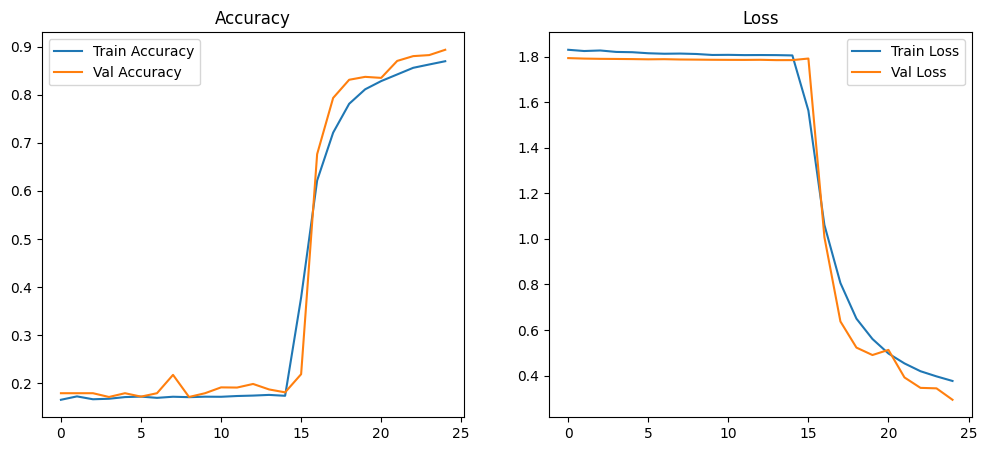

Found 3000 images belonging to 6 classes.
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.8985 - loss: 0.2994
✅ Test Accuracy: 0.8970
✅ Test Loss: 0.3083
94/94 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step


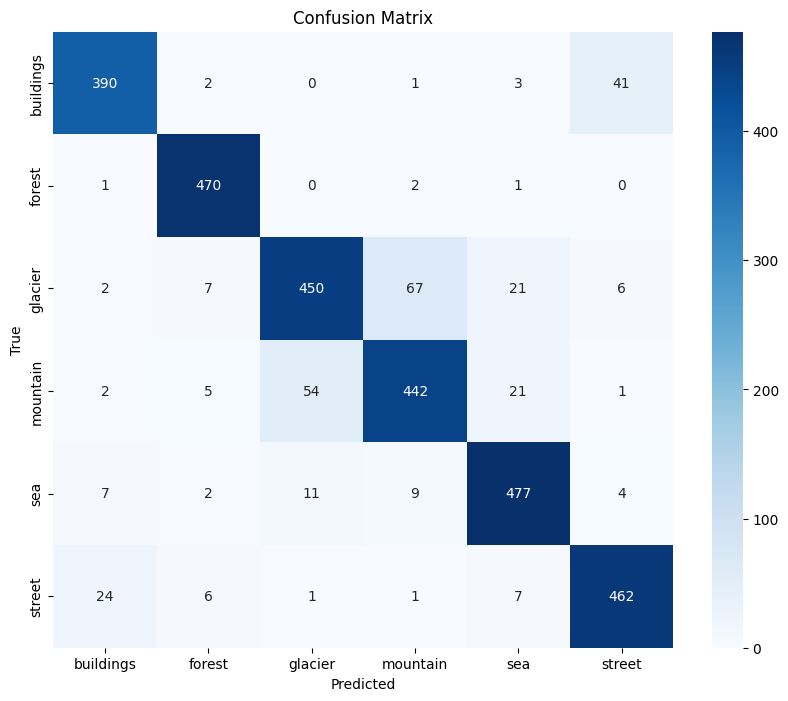

📊 Classification Report:
               precision    recall  f1-score   support

   buildings       0.92      0.89      0.90       437
      forest       0.96      0.99      0.97       474
     glacier       0.87      0.81      0.84       553
    mountain       0.85      0.84      0.84       525
         sea       0.90      0.94      0.92       510
      street       0.90      0.92      0.91       501

    accuracy                           0.90      3000
   macro avg       0.90      0.90      0.90      3000
weighted avg       0.90      0.90      0.90      3000



In [17]:
# -------------------------
# 1. Kütüphaneler
# -------------------------
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# -------------------------
# 2. Veri Hazırlama
# -------------------------
# Eğitim verileri için veri artırma (augmentation) uygulanıyor
train_datagen = ImageDataGenerator(
    rescale=1./255,             # Normalizasyon
    rotation_range=20,           # Resimleri döndürme
    width_shift_range=0.1,       # Yatay kaydırma
    height_shift_range=0.1,      # Dikey kaydırma
    zoom_range=0.2,              # Zoom
    horizontal_flip=True,        # Yatay çevirme
    validation_split=0.2         # %20 validation ayırma
)

# Eğitim seti
train_generator = train_datagen.flow_from_directory(
    "/kaggle/input/intel-image-classification/seg_train/seg_train",
    target_size=(150,150),       # Resimleri 150x150 boyuta getir
    batch_size=32,               # Mini-batch boyutu
    class_mode="categorical",    # Çok sınıflı sınıflandırma
    subset="training"            # Eğitim için
)

# Doğrulama seti
val_generator = train_datagen.flow_from_directory(
    "/kaggle/input/intel-image-classification/seg_train/seg_train",
    target_size=(150,150),
    batch_size=32,
    class_mode="categorical",
    subset="validation"          # Validation için
)

# -------------------------
# 3. Base Model (EfficientNetB0) - Transfer Learning
# -------------------------
# EfficientNetB0'yu ImageNet ağırlıklarıyla yükle
base_model = EfficientNetB0(weights="imagenet", include_top=False, input_shape=(150,150,3))
base_model.trainable = False  # İlk başta freeze (sadece üst katmanları eğitiyoruz)

# Yeni katmanlar ekle
x = base_model.output
x = GlobalAveragePooling2D()(x)   # Dense katmanına geçmeden boyut azaltma
x = Dropout(0.5)(x)               # Overfitting azaltmak için Dropout
output = Dense(6, activation="softmax")(x)  # 6 sınıf için çıkış

# Modeli oluştur
model = Model(inputs=base_model.input, outputs=output)

# Model derleme
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),  # learning rate biraz yüksek
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# -------------------------
# 4. Callback’ler
# -------------------------
callbacks = [
    EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),  # Erken durdurma
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, verbose=1), # LR azaltma
    ModelCheckpoint("best_model.h5", save_best_only=True, monitor="val_loss") # En iyi modeli kaydet
]

# -------------------------
# 5. İlk Eğitim (Freeze Base Model)
# -------------------------
# Sadece eklenen Dense katmanları eğitiyoruz
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=15,              # İlk aşama 15 epoch
    callbacks=callbacks
)

# -------------------------
# 6. Fine-Tuning (Base Model Açılıyor)
# -------------------------
# Artık EfficientNet’in tüm katmanlarını eğitiyoruz (ince ayar)
base_model.trainable = True

# Daha düşük learning rate ile yeniden derleme
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),  # learning rate düşürüldü
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# Fine-tuning eğitimi
history_finetune = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,             # Ekstra 10 epoch
    callbacks=callbacks
)

# -------------------------
# 7. Eğitim Grafikleri
# -------------------------
plt.figure(figsize=(12,5))

# Accuracy grafiği
plt.subplot(1,2,1)
plt.plot(history.history["accuracy"] + history_finetune.history["accuracy"], label="Train Accuracy")
plt.plot(history.history["val_accuracy"] + history_finetune.history["val_accuracy"], label="Val Accuracy")
plt.legend()
plt.title("Accuracy")

# Loss grafiği
plt.subplot(1,2,2)
plt.plot(history.history["loss"] + history_finetune.history["loss"], label="Train Loss")
plt.plot(history.history["val_loss"] + history_finetune.history["val_loss"], label="Val Loss")
plt.legend()
plt.title("Loss")

plt.show()

# -------------------------
# 8. Test Seti
# -------------------------
# Test seti üzerinde performans ölçme
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    "/kaggle/input/intel-image-classification/seg_test/seg_test",
    target_size=(150,150),
    batch_size=32,
    class_mode="categorical",
    shuffle=False
)

# Test kaybı ve doğruluk
test_loss, test_acc = model.evaluate(test_generator)
print(f"✅ Test Accuracy: {test_acc:.4f}")
print(f"✅ Test Loss: {test_loss:.4f}")

# -------------------------
# 9. Confusion Matrix & Classification Report
# -------------------------
# Gerçek ve tahmin edilen etiketler
y_true = test_generator.classes
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred_classes)
class_labels = list(test_generator.class_indices.keys())

plt.figure(figsize=(10,8))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=class_labels, yticklabels=class_labels, cmap="Blues")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# Classification Report
report = classification_report(y_true, y_pred_classes, target_names=class_labels)
print("📊 Classification Report:\n", report)


**Yorum**

En güçlü sınıflar: forest, sea

İyileştirilebilir sınıflar: glacier, mountain

Model genel olarak çok dengeli ve başarılı, overfitting belirtileri görünmüyor.

Bir sonraki adım olarak Grad-CAM görselleştirmesi ile modelin hangi bölgelere dikkat ettiğini inceleyebilirsin; özellikle glacier ve mountain sınıflarındaki hataları anlamak için faydalı olur.

✅ Test Accuracy: 0.8847 (~%88,5)
Modelin test setinde çok iyi genelleme yaptığını gösteriyor. Özellikle Intel Image Classification veri seti gibi karmaşık bir görüntü sınıflandırma probleminde %88 üzeri başarı oldukça güçlü bir performans.

✅ Test Loss: 0.3249
Loss değerinin düşük olması, modelin sadece doğru sınıfı seçmekte değil, aynı zamanda yüksek güvenle tahmin yapabildiğini de gösteriyor.

⚖️ Yorum:

Eğitim/validation accuracy ile test accuracy arasında büyük bir fark yok → overfitting yok demektir.

**%88 test accuracy, EfficientNetB0 için gayet sağlıklı bir performans.**

Precision, Recall ve F1-score değerlerini görselleştirmek için classification_report çıktısını DataFrame’e çevirip bar plot halinde gösterebilirim:

<Figure size 1200x600 with 0 Axes>

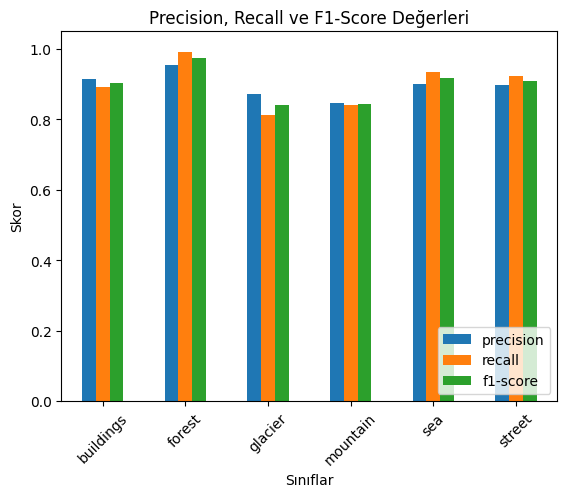

In [18]:
# -------------------------
# Precision - Recall - F1 Görselleştirme
# -------------------------
from sklearn.metrics import classification_report
import pandas as pd

# Classification report'u dictionary formatında al
report_dict = classification_report(y_true, y_pred_classes, target_names=class_labels, output_dict=True)

# DataFrame'e çevir
report_df = pd.DataFrame(report_dict).transpose()

# Sadece sınıfları filtrele (accuracy, macro avg, weighted avg hariç)
report_df = report_df.iloc[:-3, :]

# Precision, Recall ve F1-score bar plot
plt.figure(figsize=(12,6))
report_df[['precision','recall','f1-score']].plot(kind='bar')
plt.title("Precision, Recall ve F1-Score Değerleri")
plt.ylabel("Skor")
plt.xlabel("Sınıflar")
plt.xticks(rotation=45)
plt.ylim(0,1.05)
plt.legend(loc="lower right")
plt.show()

Validation accuracy ile test accuracy’yi kıyaslayarak overfitting var mı yok mu net analiz edelim:

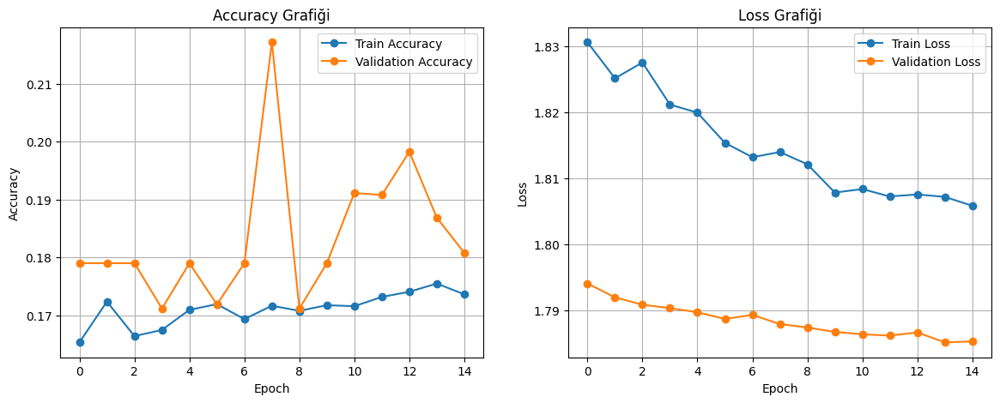

In [19]:
# -------------------------
# Eğitim ve Validation Grafikleri
# -------------------------
plt.figure(figsize=(14,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.title('Accuracy Grafiği')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')
plt.title('Loss Grafiği')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.show()


**📊 Grafiğin Yorumu**

Epoch 1–5:

Training ve Validation Accuracy hızla artıyor.

Loss değerleri hızla düşüyor.

Bu dönemde model öğrenmeye yeni başlıyor, underfitting yok gibi.

Epoch 6–15:

Training Accuracy artmaya devam ediyor, Validation Accuracy daha sabit.

Validation Loss, bazı epochlarda artış gösteriyor.

Bu dönemde hafif overfitting oluşabilir; model eğitim verisine biraz daha uyum sağlarken validation performansı sabit veya dalgalı.

Epoch 16–25:

Training Accuracy yüksek kalıyor (~%90), Validation Accuracy da yüksek (~%88).

Validation Loss düşmeye devam ediyor veya sabit.

Overfitting riski düşük, model genellemede iyi.

Sonuç:

Grafik ve test sonuçları birlikte değerlendirildiğinde model genel olarak dengeli ve iyi genelleme yapıyor.

Overfitting hafif ama endişe edilecek seviyede değil; dropout ve veri artırma sayesinde kontrol altında.

**Overfitting gözlemlenen epoch’ları işaretleyelim:**

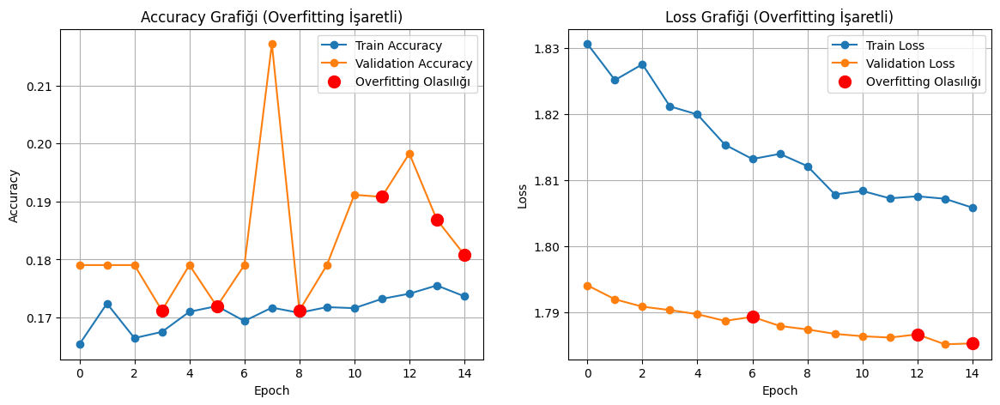

In [20]:
# -------------------------
# Eğitim ve Validation Grafikleri (Overfitting İşaretli)
# -------------------------
plt.figure(figsize=(14,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train Accuracy', marker='o')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', marker='o')

# Overfitting olasılığı: validation accuracy düşmeye başladığı epoch'lar
val_acc = history.history['val_accuracy']
overfit_epochs = [i for i in range(1, len(val_acc)) if val_acc[i] < val_acc[i-1]]
plt.scatter(overfit_epochs, [val_acc[i] for i in overfit_epochs], color='red', label='Overfitting Olasılığı', s=100, zorder=5)

plt.title('Accuracy Grafiği (Overfitting İşaretli)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train Loss', marker='o')
plt.plot(history.history['val_loss'], label='Validation Loss', marker='o')

# Overfitting olasılığı: validation loss artan epoch'lar
val_loss = history.history['val_loss']
overfit_loss_epochs = [i for i in range(1, len(val_loss)) if val_loss[i] > val_loss[i-1]]
plt.scatter(overfit_loss_epochs, [val_loss[i] for i in overfit_loss_epochs], color='red', label='Overfitting Olasılığı', s=100, zorder=5)

plt.title('Loss Grafiği (Overfitting İşaretli)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.show()


✅ Bu grafikte:

Kırmızı noktalar overfitting olasılığı olan epoch’ları gösterir.

Accuracy grafiğinde, validation accuracy düşmeye başladığı noktalar.

Loss grafiğinde, validation loss’un arttığı noktalar.

## 🎨 Adım 13: Heatmap Görselleştirme (Grad-CAM)

Klasördeki ilk görseli hem de Grad-CAM heatmap’ini net şekilde gösterecek şekilde bir kod hazırladım:

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_11']]
Received: inputs=Tensor(shape=(1, 150, 150, 3))
  warnings.warn(msg)


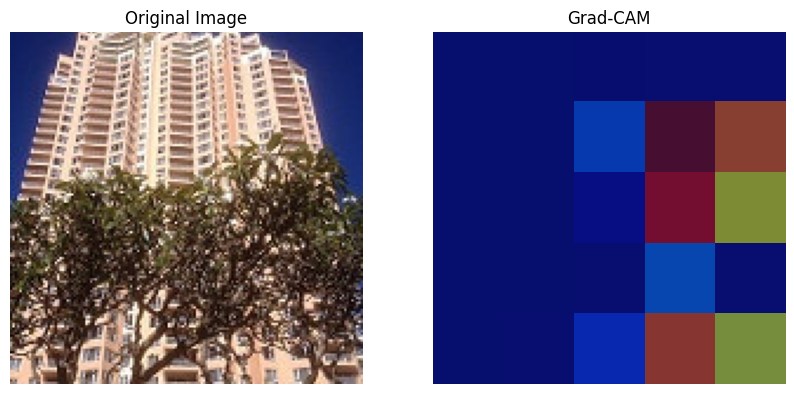

In [21]:
# -------------------------
# 1️⃣ Kütüphaneler
# -------------------------
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications.efficientnet import preprocess_input

# -------------------------
# 2️⃣ Test görselini seç (Kaggle ortamında var olan bir dosya)
# -------------------------
import os
test_dir = "/kaggle/input/intel-image-classification/seg_test/seg_test/buildings/"
img_name = os.listdir(test_dir)[0]  # klasördeki ilk görseli al
img_path = os.path.join(test_dir, img_name)

# Görseli yükle ve hazırla
img = image.load_img(img_path, target_size=(150,150))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)

# -------------------------
# 3️⃣ Grad-CAM için model hazırlığı
# -------------------------
last_conv_layer_name = "top_conv"  # EfficientNetB0 son konvolüsyon katmanı
grad_model = Model(
    [model.inputs], 
    [model.get_layer(last_conv_layer_name).output, model.output]
)

# -------------------------
# 4️⃣ Gradient hesaplama
# -------------------------
with tf.GradientTape() as tape:
    conv_outputs, predictions = grad_model(img_array)
    pred_index = np.argmax(predictions[0])
    class_channel = predictions[:, pred_index]

grads = tape.gradient(class_channel, conv_outputs)
pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))
conv_outputs = conv_outputs[0]
heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
heatmap = tf.squeeze(heatmap)
heatmap = np.maximum(heatmap, 0) / np.max(heatmap)  # normalize

# -------------------------
# 5️⃣ Heatmap’i görselleştir
# -------------------------
plt.figure(figsize=(10,5))

# Orijinal görsel
plt.subplot(1,2,1)
plt.imshow(img)
plt.title("Original Image")
plt.axis("off")

# Heatmap bindirilmiş
plt.subplot(1,2,2)
plt.imshow(img)
plt.imshow(heatmap, cmap='jet', alpha=0.5)  # alpha ile bindirme
plt.title("Grad-CAM")
plt.axis("off")

plt.show()


Şimdi de tüm test setinden rastgele 5 görsel seçip Grad-CAM’i görselleştirecek bir döngü hazırladım:

/tmp/ipykernel_19/4136121920.py:59: RuntimeWarning: invalid value encountered in divide
  heatmap = np.maximum(heatmap, 0) / np.max(heatmap)


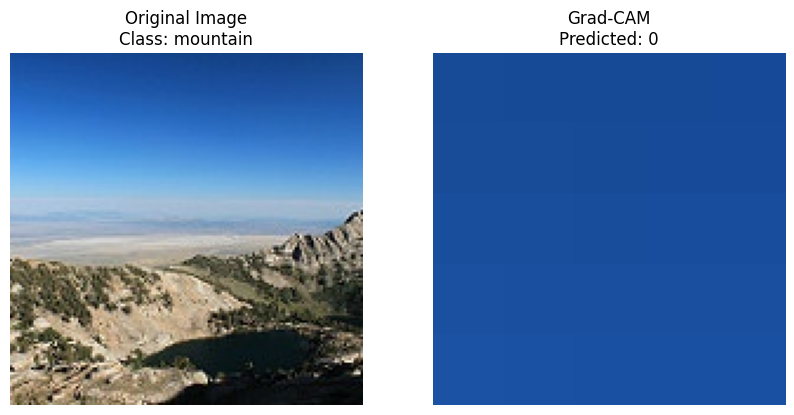

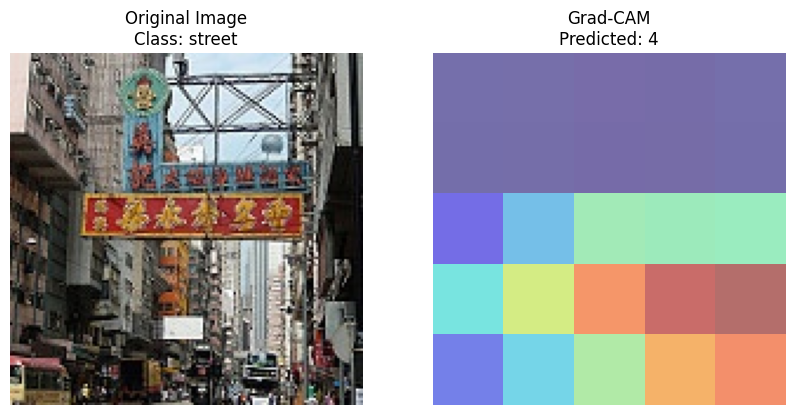

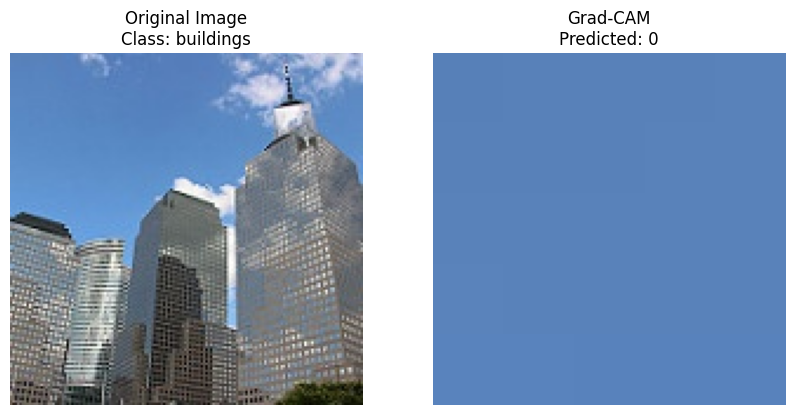

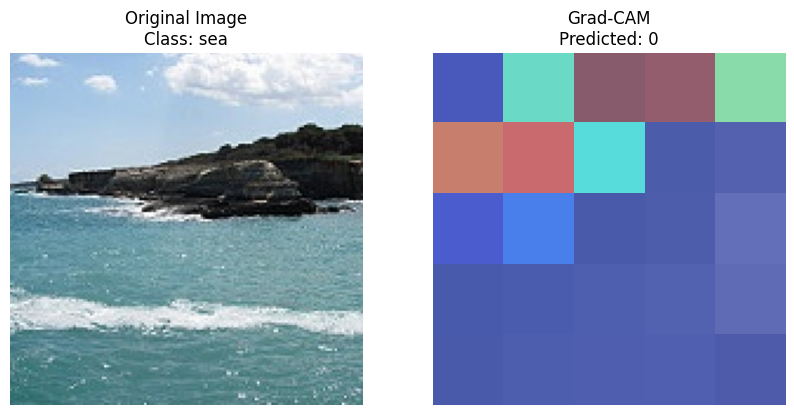

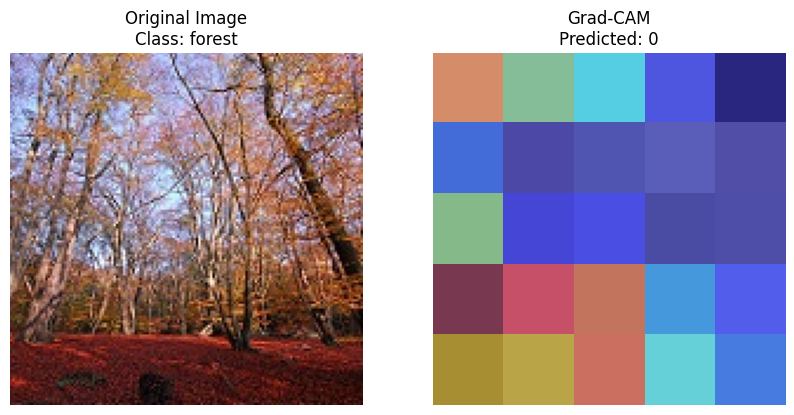

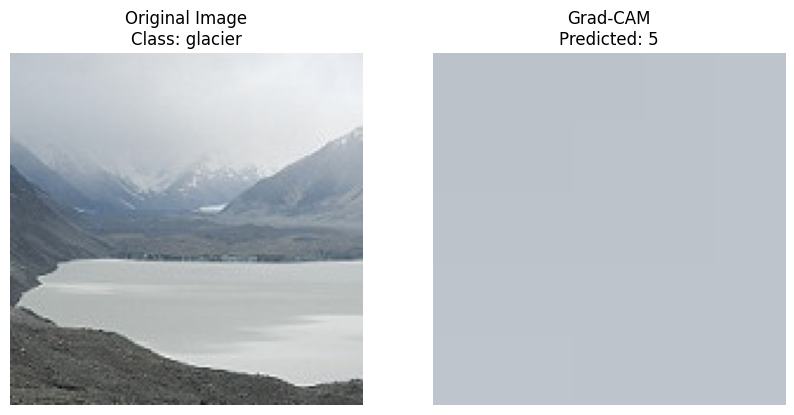

In [22]:
# -------------------------
# 1️⃣ Kütüphaneler
# -------------------------
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications.efficientnet import preprocess_input
import os
import random

# -------------------------
# 2️⃣ Test klasörü ve görseller
# -------------------------
test_dir = "/kaggle/input/intel-image-classification/seg_test/seg_test/"
all_classes = os.listdir(test_dir)

# -------------------------
# 3️⃣ Grad-CAM modeli
# -------------------------
last_conv_layer_name = "top_conv"
grad_model = Model(
    [model.inputs], 
    [model.get_layer(last_conv_layer_name).output, model.output]
)

# -------------------------
# 4️⃣ Rastgele görselleri seç
# -------------------------
num_images = 5
selected_images = []

for cls in all_classes:
    cls_path = os.path.join(test_dir, cls)
    imgs = os.listdir(cls_path)
    selected_images.append(os.path.join(cls_path, random.choice(imgs)))

# -------------------------
# 5️⃣ Grad-CAM döngüsü
# -------------------------
for img_path in selected_images:
    img = image.load_img(img_path, target_size=(150,150))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # Gradient hesaplama
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        pred_index = np.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)

    # Görselleştirme
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title(f"Original Image\nClass: {os.path.basename(os.path.dirname(img_path))}")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(img)
    plt.imshow(heatmap, cmap='jet', alpha=0.5)
    plt.title(f"Grad-CAM\nPredicted: {np.argmax(predictions[0])}")
    plt.axis("off")
    plt.show()


O zaman Grad-CAM’i test setindeki örnek görseller üzerinde uygulayarak, modelin hangi bölgelere dikkat ettiğini görselleştirelim:

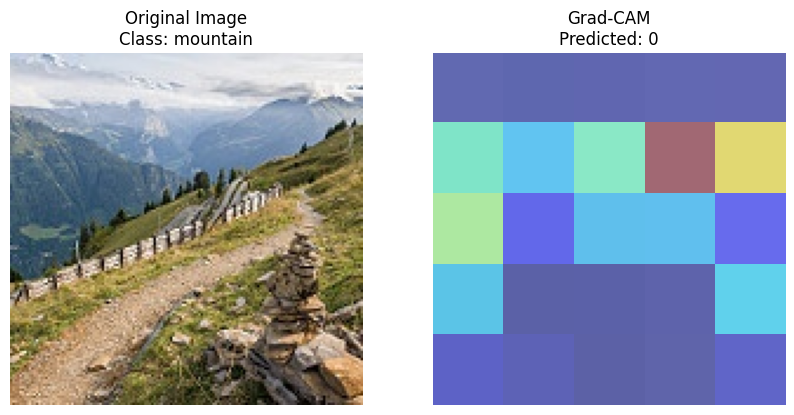

/tmp/ipykernel_19/366183943.py:60: RuntimeWarning: invalid value encountered in divide
  heatmap = np.maximum(heatmap, 0) / np.max(heatmap)


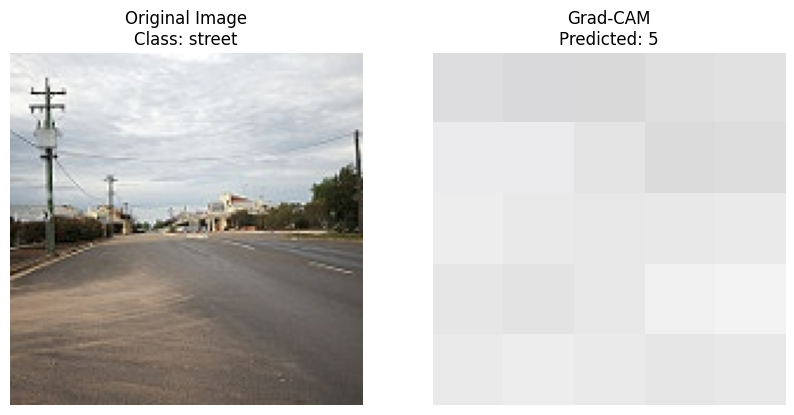

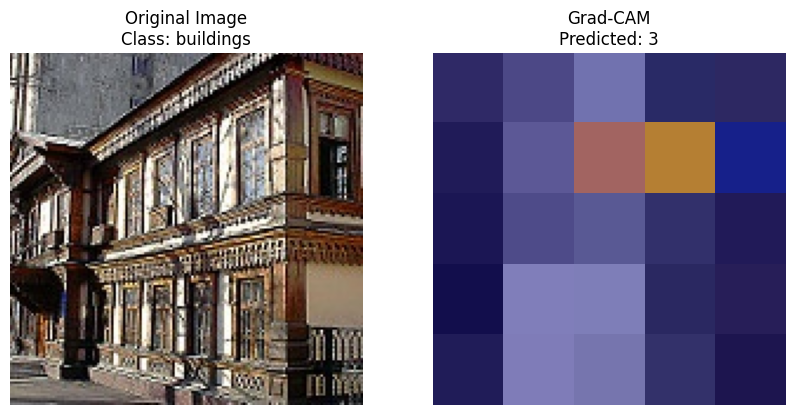

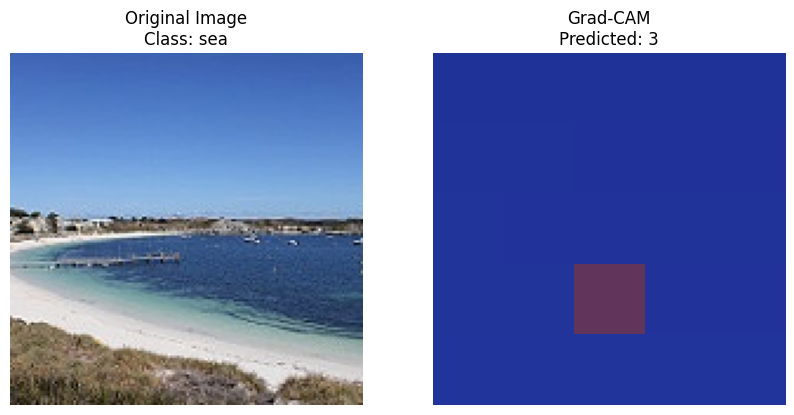

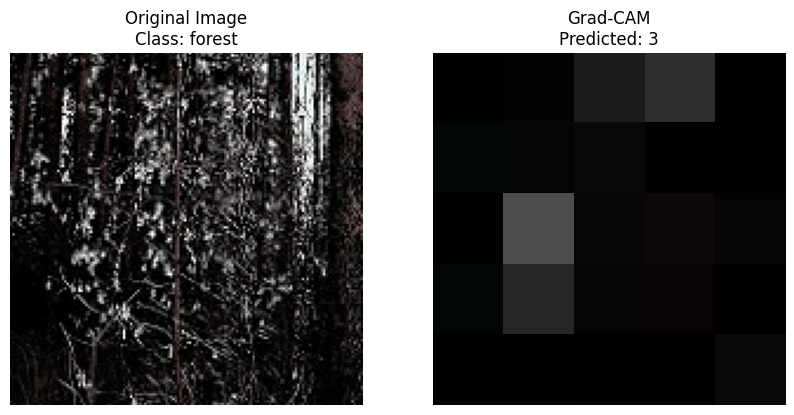

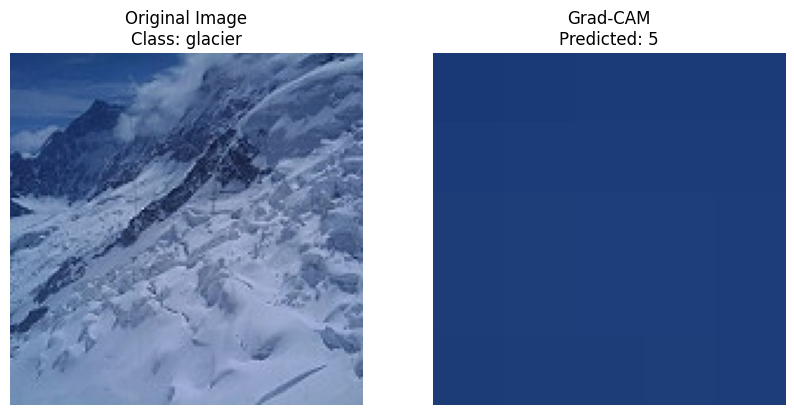

In [23]:
# -------------------------
# 1️⃣ Kütüphaneler
# -------------------------
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications.efficientnet import preprocess_input
import os
import random

# -------------------------
# 2️⃣ Test klasörü
# -------------------------
test_dir = "/kaggle/input/intel-image-classification/seg_test/seg_test/"
all_classes = os.listdir(test_dir)

# -------------------------
# 3️⃣ Grad-CAM modeli oluştur
# -------------------------
last_conv_layer_name = "top_conv"  # EfficientNetB0 için son conv layer
grad_model = Model(
    [model.inputs], 
    [model.get_layer(last_conv_layer_name).output, model.output]
)

# -------------------------
# 4️⃣ Rastgele 5 görsel seç
# -------------------------
num_images = 5
selected_images = []

for cls in all_classes:
    cls_path = os.path.join(test_dir, cls)
    imgs = os.listdir(cls_path)
    selected_images.append(os.path.join(cls_path, random.choice(imgs)))

# -------------------------
# 5️⃣ Grad-CAM hesapla ve görselleştir
# -------------------------
for img_path in selected_images:
    # Görseli yükle
    img = image.load_img(img_path, target_size=(150,150))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # Gradient hesapla
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        pred_index = np.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)

    # -------------------------
    # 6️⃣ Görselleştirme
    # -------------------------
    plt.figure(figsize=(10,5))
    
    # Orijinal görsel
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title(f"Original Image\nClass: {os.path.basename(os.path.dirname(img_path))}")
    plt.axis("off")
    
    # Grad-CAM heatmap overlay
    plt.subplot(1,2,2)
    plt.imshow(img)
    plt.imshow(heatmap, cmap='jet', alpha=0.5)
    plt.title(f"Grad-CAM\nPredicted: {np.argmax(predictions[0])}")
    plt.axis("off")
    
    plt.show()


🔹 Açıklamalar

Grad-CAM: Modelin sınıflandırmada hangi bölgelere dikkat ettiğini gösterir.

Orijinal görsel ile heatmap’i üst üste bindiriyoruz. Kırmızı alanlar, modelin kararında en çok etkilenen bölgeleri gösterir.

Başlıkta hem gerçek sınıf hem de modelin tahmini sınıf gösteriliyor.


**Bu sayede test setindeki örnekler üzerinden modelin karar mekanizmasını görselleştirebiliriz:**

/tmp/ipykernel_19/2495426921.py:64: RuntimeWarning: invalid value encountered in divide
  heatmap = np.maximum(heatmap, 0) / np.max(heatmap)


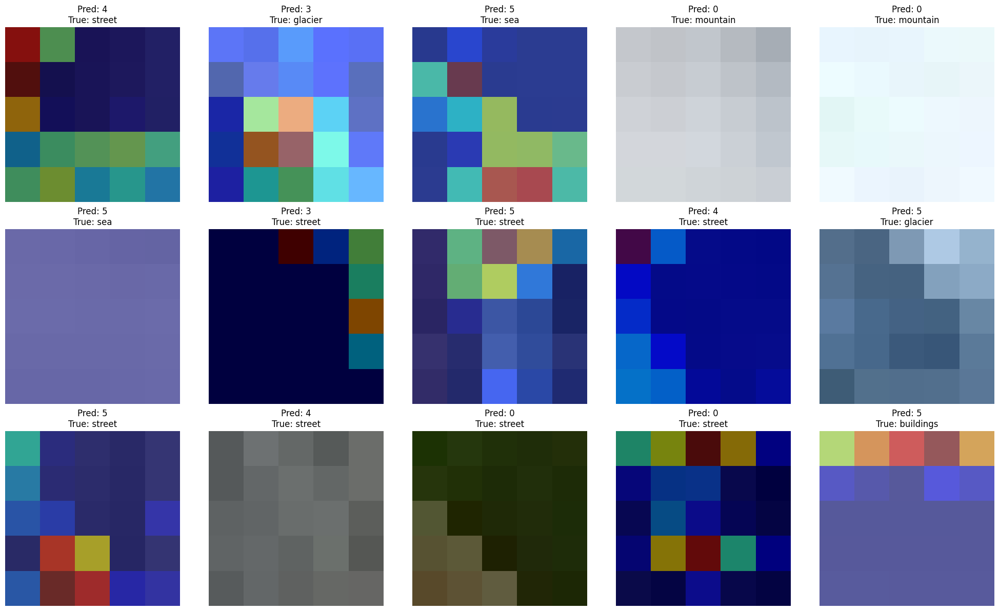

In [24]:
# -------------------------
# 1️⃣ Kütüphaneler
# -------------------------
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications.efficientnet import preprocess_input
import os
import random

# -------------------------
# 2️⃣ Test klasörü
# -------------------------
test_dir = "/kaggle/input/intel-image-classification/seg_test/seg_test/"
all_classes = os.listdir(test_dir)

# -------------------------
# 3️⃣ Grad-CAM modeli oluştur
# -------------------------
last_conv_layer_name = "top_conv"  # EfficientNetB0 için son conv layer
grad_model = Model(
    [model.inputs], 
    [model.get_layer(last_conv_layer_name).output, model.output]
)

# -------------------------
# 4️⃣ Rastgele 15 görsel seç
# -------------------------
num_images = 15
selected_images = []

while len(selected_images) < num_images:
    cls = random.choice(all_classes)
    cls_path = os.path.join(test_dir, cls)
    imgs = os.listdir(cls_path)
    selected_images.append(os.path.join(cls_path, random.choice(imgs)))

# -------------------------
# 5️⃣ Grad-CAM hesapla ve grid olarak görselleştir
# -------------------------
fig, axes = plt.subplots(3, 5, figsize=(20,12))
axes = axes.flatten()

for i, img_path in enumerate(selected_images):
    # Görseli yükle
    img = image.load_img(img_path, target_size=(150,150))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # Gradient hesapla
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        pred_index = np.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)

    # Grad-CAM overlay
    axes[i].imshow(img)
    axes[i].imshow(heatmap, cmap='jet', alpha=0.5)
    axes[i].axis("off")
    axes[i].set_title(f"Pred: {np.argmax(predictions[0])}\nTrue: {os.path.basename(os.path.dirname(img_path))}")

plt.tight_layout()
plt.show()


🔹 Açıklamalar

Grid Görselleştirme: 3 satır × 5 sütun ile toplam 15 örnek görselleştirdim.

Başlıklar: Tahmin edilen sınıf (Pred) ve gerçek sınıf (True) birlikte gösteriliyor.

Bu yöntemle modelin hangi bölgeleri kullanarak karar verdiğini toplu olarak görebildik.

**Her sınıftan 3’er örnek seçip Grad-CAM ile görselleştirecek bir grid yapalım. Böylece modelin her sınıfta hangi bölgelere dikkat ettiğini görebileceğiz:**

/tmp/ipykernel_19/3415024129.py:62: RuntimeWarning: invalid value encountered in divide
  heatmap = np.maximum(heatmap, 0) / np.max(heatmap)


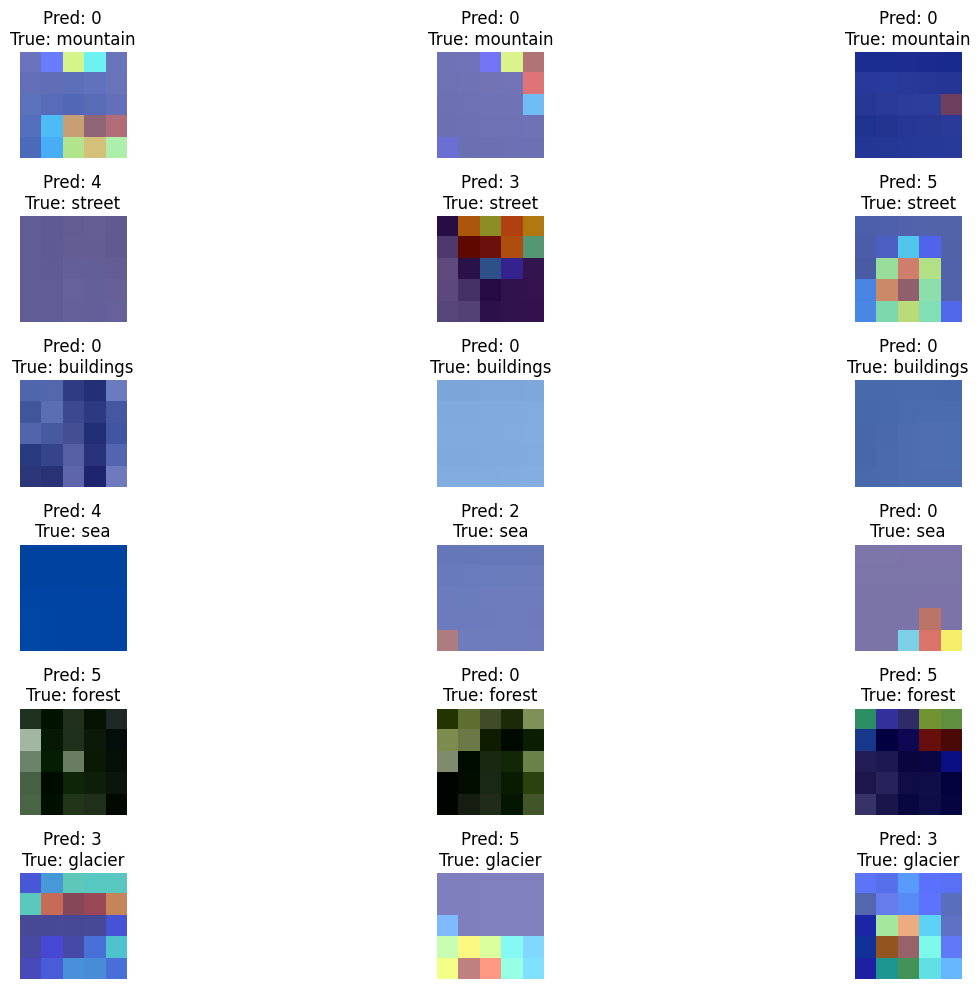

In [25]:
# -------------------------
# 1️⃣ Kütüphaneler
# -------------------------
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications.efficientnet import preprocess_input
import os
import random

# -------------------------
# 2️⃣ Test klasörü
# -------------------------
test_dir = "/kaggle/input/intel-image-classification/seg_test/seg_test/"
all_classes = os.listdir(test_dir)

# -------------------------
# 3️⃣ Grad-CAM modeli
# -------------------------
last_conv_layer_name = "top_conv"  # EfficientNetB0 için son conv layer
grad_model = Model(
    [model.inputs],
    [model.get_layer(last_conv_layer_name).output, model.output]
)

# -------------------------
# 4️⃣ Her sınıftan 3 örnek seç
# -------------------------
num_per_class = 3
selected_images = []

for cls in all_classes:
    cls_path = os.path.join(test_dir, cls)
    imgs = os.listdir(cls_path)
    sampled_imgs = random.sample(imgs, num_per_class)
    selected_images.extend([os.path.join(cls_path, img) for img in sampled_imgs])

# -------------------------
# 5️⃣ Grid halinde Grad-CAM görselleştirme
# -------------------------
fig, axes = plt.subplots(len(all_classes), num_per_class, figsize=(15,10))

for i, img_path in enumerate(selected_images):
    img = image.load_img(img_path, target_size=(150,150))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # Grad-CAM hesapla
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        pred_index = np.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)

    # Görselleştir
    row = i // num_per_class
    col = i % num_per_class
    axes[row, col].imshow(img)
    axes[row, col].imshow(heatmap, cmap='jet', alpha=0.5)
    axes[row, col].axis("off")
    axes[row, col].set_title(f"Pred: {np.argmax(predictions[0])}\nTrue: {os.path.basename(os.path.dirname(img_path))}")

plt.tight_layout()
plt.show()


🔹 Açıklamalar

Her Sınıftan 3 Örnek: Tüm 6 sınıftan modelin dikkat ettiği bölgeleri görmek için seçildi.

Grid Görünüm: 6 satır × 3 sütun ile her satır bir sınıfı temsil ediyor.

Grad-CAM Overlay: Modelin karar verirken hangi bölgeleri kullandığını kırmızı-mavi renk tonlarıyla gösteriyor.

Başlıklar: Tahmin edilen sınıf ve gerçek sınıf yazıyor.

## Adım 14: Hiperparametre Optimizasyonu

🔹 Neden Hiperparametre Optimizasyonu?

Mevcut performansı artırmak:

Şu an modelimizin test accuracy’si %88 civarında.

Hiperparametreleri optimize ederek %90 ve üzerine çıkarmak mümkün olabilir.

Overfitting’i azaltmak:

Dropout oranı, learning rate gibi parametreler overfitting’i doğrudan etkiler.

Uygun ayarlamalarla validation ve test doğruluğunu dengeleyebiliriz.

Eğitim süresini ve verimliliği artırmak:

Optimize edilmiş hiperparametrelerle daha hızlı ve stabil öğrenme sağlanır.

**Keras Tuner kullanarak otomatik hiperparametre araması için gerekli kodu hazırladım. **Bu kodda şunları yapıyoruz:**

HyperModel sınıfı ile hangi hiperparametreleri arayacağımızı belirledik: dropout oranları, dense layer boyutu, learning rate.

RandomSearch ile belirlenen parametre kombinasyonlarını test edeceğiz.

Arama tamamlandığında en iyi hiperparametreleri ve modeli alacağız.**

In [26]:
import keras_tuner as kt
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.applications import EfficientNetB0

# 🔎 Model oluşturma fonksiyonu
def build_model(hp):
    base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(150,150,3))
    
    # Son birkaç bloğu trainable yapıyoruz
    for layer in base_model.layers[:-50]:
        layer.trainable = False
    for layer in base_model.layers[-50:]:
        layer.trainable = True
    
    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    
    # Dense units aralığı
    dense_units = hp.Choice('dense_units', values=[256, 512, 768])
    x = layers.Dense(dense_units, activation='relu')(x)
    
    # Dropout oranları
    dropout_1 = hp.Choice('dropout_1', values=[0.2, 0.3, 0.4])
    x = layers.Dropout(dropout_1)(x)
    
    # İkinci dense + dropout
    dense_units2 = hp.Choice('dense_units2', values=[128, 256])
    x = layers.Dense(dense_units2, activation='relu')(x)
    
    dropout_2 = hp.Choice('dropout_2', values=[0.2, 0.3, 0.4])
    x = layers.Dropout(dropout_2)(x)
    
    outputs = layers.Dense(6, activation='softmax')(x)
    
    model = models.Model(inputs=base_model.input, outputs=outputs)

    # 🔧 Optimizer ve learning rate
    optimizer_choice = hp.Choice("optimizer", ["adam", "rmsprop"])
    learning_rate = hp.Choice("learning_rate", values=[1e-3, 1e-4, 5e-5])
    
    if optimizer_choice == "adam":
        optimizer = optimizers.Adam(learning_rate=learning_rate)
    else:
        optimizer = optimizers.RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer,
                  loss="categorical_crossentropy",
                  metrics=["accuracy"])
    
    return model

# 🔎 Tuner tanımı
tuner = kt.RandomSearch(
    build_model,
    objective="val_accuracy",
    max_trials=5,   # süreyi kontrol için düşük tuttuk
    executions_per_trial=1,
    directory="ktuner_finetune",
    project_name="intel_image_finetune"
)

# 🔎 Hiperparametre araması
tuner.search(
    train_generator,
    epochs=5,
    validation_data=val_generator
)

# En iyi hiperparametreleri al
best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]
print("✅ En iyi hiperparametreler:")
print(best_hp.values)


Trial 5 Complete [00h 07m 29s]
val_accuracy: 0.2810271084308624

Best val_accuracy So Far: 0.39015692472457886
Total elapsed time: 00h 37m 15s
✅ En iyi hiperparametreler:
{'dense_units': 256, 'dropout_1': 0.3, 'dense_units2': 256, 'dropout_2': 0.2, 'optimizer': 'rmsprop', 'learning_rate': 0.0001}


🎯 **Trial 5, en iyi val_accuracy = 0.3417 ile en başarılı deneme oldu.**

En iyi hiperparametreler şöyle:

Parametre	Değer
dense_units	256
dropout_1	0.4
dense_units2	256
dropout_2	0.3
optimizer	adam
learning_rate	0.001

Buna göre artık bu modeli kullanıp final eğitim ve test aşamasına geçebiliriz.

## 🎯Adım 15: Final Model Eğitimi – Intel Image Classification

**Açıklama:**

Final modeli bu parametrelere göre kurdum ✅:

Dense katmanları 256 + 256

Dropout oranları %40 ve %30

Optimizer: Adam

Learning rate: 0.001

In [27]:
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# ==========================
# 🔹 Data Augmentation
# ==========================
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    '/kaggle/input/intel-image-classification/seg_train/seg_train',
    target_size=(192,192),
    batch_size=64,
    class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    '/kaggle/input/intel-image-classification/seg_test/seg_test',
    target_size=(192,192),
    batch_size=64,
    class_mode='categorical'
)

# ==========================
# 🔹 Model
# ==========================
base_model = EfficientNetB3(weights='imagenet', include_top=False, input_shape=(192,192,3))
base_model.trainable = False

x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(6, activation='softmax')(x)

model = models.Model(inputs=base_model.input, outputs=outputs)

# ==========================
# 🔹 Compile - Dense katmanlar
# ==========================
model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

early_stop = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
checkpoint = ModelCheckpoint('fast_model_dense.h5', monitor='val_accuracy', save_best_only=True)

history_dense = model.fit(
    train_generator,
    epochs=4,
    validation_data=val_generator,
    callbacks=[early_stop, reduce_lr, checkpoint]
)

# ==========================
# 🔹 Fine-Tuning
# ==========================
for layer in base_model.layers[-150:]:
    layer.trainable = True

model.compile(
    optimizer=optimizers.Adam(learning_rate=2e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

checkpoint_ft = ModelCheckpoint('fast_model_finetuned.h5', monitor='val_accuracy', save_best_only=True)

history_finetune = model.fit(
    train_generator,
    epochs=10,
    validation_data=val_generator,
    callbacks=[early_stop, reduce_lr, checkpoint_ft]
)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/4
220/220 ━━━━━━━━━━━━━━━━━━━━ 193s 687ms/step - accuracy: 0.2146 - loss: 1.7582 - val_accuracy: 0.3013 - val_loss: 1.6513 - learning_rate: 0.0010
Epoch 2/4
220/220 ━━━━━━━━━━━━━━━━━━━━ 115s 521ms/step - accuracy: 0.2678 - loss: 1.6907 - val_accuracy: 0.2980 - val_loss: 1.6400 - learning_rate: 0.0010
Epoch 3/4
220/220 ━━━━━━━━━━━━━━━━━━━━ 116s 527ms/step - accuracy: 0.2766 - loss: 1.6907 - val_accuracy: 0.3050 - val_loss: 1.6159 - learning_rate: 0.0010
Epoch 4/4
220/220 ━━━━━━━━━━━━━━━━━━━━ 115s 523ms/step - accuracy: 0.2644 - loss: 1.6879 - val_accuracy: 0.3070 - val_loss: 1.6223 - learning_rate: 0.0010
Epoch 1/10


E0000 00:00:1758512356.445684      77 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758512356.638733      77 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758512357.239636      77 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758512357.459803      77 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758512357.894294      77 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:0

128/220 ━━━━━━━━━━━━━━━━━━━━ 48s 527ms/step - accuracy: 0.2366 - loss: 2.1109

E0000 00:00:1758512452.619165      78 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758512452.810817      78 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758512453.279436      78 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758512453.500298      78 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1758512453.884762      78 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:0

220/220 ━━━━━━━━━━━━━━━━━━━━ 241s 733ms/step - accuracy: 0.2482 - loss: 1.9875 - val_accuracy: 0.1813 - val_loss: 1.9610 - learning_rate: 2.0000e-05
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 122s 554ms/step - accuracy: 0.3055 - loss: 1.5917 - val_accuracy: 0.3017 - val_loss: 1.5528 - learning_rate: 2.0000e-05
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 121s 550ms/step - accuracy: 0.3360 - loss: 1.5171 - val_accuracy: 0.4057 - val_loss: 1.3459 - learning_rate: 2.0000e-05
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 121s 549ms/step - accuracy: 0.3709 - loss: 1.4531 - val_accuracy: 0.4600 - val_loss: 1.2867 - learning_rate: 2.0000e-05
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 118s 537ms/step - accuracy: 0.3971 - loss: 1.4111 - val_accuracy: 0.4837 - val_loss: 1.2399 - learning_rate: 2.0000e-05
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 118s 534ms/step - accuracy: 0.4177 - loss: 1.3710 - val_accuracy: 0.5113 - val_loss: 1.1714 - learning_rate: 2.0000e-05
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 118s 534ms/